In [1]:
import pandas as pd
from math import sqrt
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import cross_val_score
import numpy as np
from sklearn.metrics import mean_absolute_error, r2_score

In [ ]:
x_train = pd.read_excel("x_train.xlsx")
x_test = pd.read_excel("x_test.xlsx")
y_train = pd.read_excel("y_train.xlsx")
y_test = pd.read_excel("y_test.xlsx")

In [2]:
df = pd.read_excel('data1.xlsx')
df

,folder,energy,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,...,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,transmission
0,301,-1.495,1.480837,0.389803,-0.542789,-0.445962,-0.302554,-1.543986,0.563627,-0.148149,...,0.917159,0.777488,-0.501047,-0.133735,0.414178,1.320111,-0.602763,0.664234,-0.994468,2.416764e-09
1,301,-1.485,1.480837,0.389803,-0.542789,-0.445962,-0.302554,-1.543986,0.563627,-0.148149,...,0.917159,0.777488,-0.501047,-0.133735,0.414178,1.320111,-0.602763,0.664234,-0.994468,1.848424e-09
2,301,-1.475,1.480837,0.389803,-0.542789,-0.445962,-0.302554,-1.543986,0.563627,-0.148149,...,0.917159,0.777488,-0.501047,-0.133735,0.414178,1.320111,-0.602763,0.664234,-0.994468,1.413399e-09
3,301,-1.465,1.480837,0.389803,-0.542789,-0.445962,-0.302554,-1.543986,0.563627,-0.148149,...,0.917159,0.777488,-0.501047,-0.133735,0.414178,1.320111,-0.602763,0.664234,-0.994468,1.096942e-09
4,301,-1.455,1.480837,0.389803,-0.542789,-0.445962,-0.302554,-1.543986,0.563627,-0.148149,...,0.917159,0.777488,-0.501047,-0.133735,0.414178,1.320111,-0.602763,0.664234,-0.994468,8.568933e-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,932,1.455,0.420684,-1.523324,0.410065,0.606160,-0.230317,0.619051,0.852031,2.349536,...,0.352108,-0.494944,-0.537925,-1.169666,-1.989014,1.391024,0.002196,0.160959,-0.120276,2.149107e-11
14996,932,1.465,0.420684,-1.523324,0.410065,0.606160,-0.230317,0.619051,0.852031,2.349536,...,0.352108,-0.494944,-0.537925,-1.169666,-1.989014,1.391024,0.002196,0.160959,-0.120276,2.538670e-11
14997,932,1.475,0.420684,-1.523324,0.410065,0.606160,-0.230317,0.619051,0.852031,2.349536,...,0.352108,-0.494944,-0.537925,-1.169666,-1.989014,1.391024,0.002196,0.160959,-0.120276,3.020736e-11
14998,932,1.485,0.420684,-1.523324,0.410065,0.606160,-0.230317,0.619051,0.852031,2.349536,...,0.352108,-0.494944,-0.537925,-1.169666,-1.989014,1.391024,0.002196,0.160959,-0.120276,3.623582e-11


In [ ]:
df2 = df.sample(frac=1, random_state=42).reset_index(drop=True)
df2

,folder,energy,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,...,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,transmission
0,790,-0.505,-0.540816,-0.879096,0.451901,0.674895,-0.956298,-0.030801,0.194039,-0.858409,...,-0.445444,0.604307,-1.148394,-0.843046,-0.190896,-0.606266,-1.471792,-1.047049,1.695956,6.701485e-13
1,571,0.255,1.614307,0.395181,0.550293,0.336359,0.423394,-1.695505,1.533285,1.103847,...,-0.563992,1.101586,0.842946,-0.906389,-0.307906,0.171063,0.929179,-1.637471,-0.277495,1.146447e-13
2,854,1.175,-0.861225,-0.807390,0.563473,-0.165382,-1.087301,-0.427785,-0.825689,-0.905329,...,1.947803,0.017154,-0.905316,0.268676,-0.898798,0.105111,0.047275,0.031874,-1.347071,1.942278e-12
3,326,1.125,0.575127,0.332925,0.101663,0.158581,0.853953,0.648599,-2.758523,2.048160,...,0.669748,0.452922,-0.614297,-0.958721,-0.028772,-0.623859,-1.119245,0.083000,1.102857,2.501188e-11
4,545,1.205,0.689830,0.886929,2.375997,-0.125738,1.659024,0.135686,1.188878,0.824287,...,1.822264,-0.671967,1.986152,0.679396,0.966435,-0.829286,-0.251625,1.247493,-0.772497,3.987619e-13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,519,-0.585,-0.418311,1.216127,1.702878,-1.490701,0.097152,0.100954,-0.566040,-0.656988,...,-0.657656,0.974382,0.168085,1.948140,0.278420,-0.793103,1.221053,0.207055,2.636851,9.268307e-12
14996,867,0.685,-0.786441,-1.128016,0.888802,0.460469,0.352519,-1.094716,-0.031362,0.578785,...,-0.548966,-0.088806,1.514715,0.951683,1.416370,-0.805231,-1.587232,-0.059447,0.602268,6.090163e-14
14997,519,1.405,-0.418311,1.216127,1.702878,-1.490701,0.097152,0.100954,-0.566040,-0.656988,...,-0.657656,0.974382,0.168085,1.948140,0.278420,-0.793103,1.221053,0.207055,2.636851,8.461078e-11
14998,326,1.105,0.575127,0.332925,0.101663,0.158581,0.853953,0.648599,-2.758523,2.048160,...,0.669748,0.452922,-0.614297,-0.958721,-0.028772,-0.623859,-1.119245,0.083000,1.102857,2.180741e-11


In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
x = df2.iloc[:, 1:-1]  # exclude first and last columns
x

,energy,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,...,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40
0,-0.505,-0.540816,-0.879096,0.451901,0.674895,-0.956298,-0.030801,0.194039,-0.858409,-0.579126,...,0.461862,-0.445444,0.604307,-1.148394,-0.843046,-0.190896,-0.606266,-1.471792,-1.047049,1.695956
1,0.255,1.614307,0.395181,0.550293,0.336359,0.423394,-1.695505,1.533285,1.103847,0.336753,...,-2.454628,-0.563992,1.101586,0.842946,-0.906389,-0.307906,0.171063,0.929179,-1.637471,-0.277495
2,1.175,-0.861225,-0.807390,0.563473,-0.165382,-1.087301,-0.427785,-0.825689,-0.905329,-0.844809,...,-0.401163,1.947803,0.017154,-0.905316,0.268676,-0.898798,0.105111,0.047275,0.031874,-1.347071
3,1.125,0.575127,0.332925,0.101663,0.158581,0.853953,0.648599,-2.758523,2.048160,-0.570523,...,0.497812,0.669748,0.452922,-0.614297,-0.958721,-0.028772,-0.623859,-1.119245,0.083000,1.102857
4,1.205,0.689830,0.886929,2.375997,-0.125738,1.659024,0.135686,1.188878,0.824287,0.165149,...,1.872643,1.822264,-0.671967,1.986152,0.679396,0.966435,-0.829286,-0.251625,1.247493,-0.772497
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,-0.585,-0.418311,1.216127,1.702878,-1.490701,0.097152,0.100954,-0.566040,-0.656988,-0.392070,...,-2.250486,-0.657656,0.974382,0.168085,1.948140,0.278420,-0.793103,1.221053,0.207055,2.636851
14996,0.685,-0.786441,-1.128016,0.888802,0.460469,0.352519,-1.094716,-0.031362,0.578785,1.362995,...,-0.568324,-0.548966,-0.088806,1.514715,0.951683,1.416370,-0.805231,-1.587232,-0.059447,0.602268
14997,1.405,-0.418311,1.216127,1.702878,-1.490701,0.097152,0.100954,-0.566040,-0.656988,-0.392070,...,-2.250486,-0.657656,0.974382,0.168085,1.948140,0.278420,-0.793103,1.221053,0.207055,2.636851
14998,1.105,0.575127,0.332925,0.101663,0.158581,0.853953,0.648599,-2.758523,2.048160,-0.570523,...,0.497812,0.669748,0.452922,-0.614297,-0.958721,-0.028772,-0.623859,-1.119245,0.083000,1.102857


In [ ]:
df2.columns = df2.columns.str.strip()
y = df2['transmission']
y

,transmission
0,6.701485e-13
1,1.146447e-13
2,1.942278e-12
3,2.501188e-11
4,3.987619e-13
...,...
14995,9.268307e-12
14996,6.090163e-14
14997,8.461078e-11
14998,2.180741e-11


# **Histogram**

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=42)

In [ ]:
x_train.to_excel('x_train.xlsx')
y_train.to_excel('y_train.xlsx')
x_test.to_excel('x_test.xlsx')
y_test.to_excel('y_test.xlsx')

# **Data Split**

# **Pearson Heatmap**

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

corr = x.corr()

plt.figure(figsize=(12, 10))
plt.gcf().patch.set_facecolor('white')  # Set white background
plt.xticks(weight='bold', fontsize=10)
plt.yticks(weight='bold', fontsize=10)
plt.rcParams['figure.dpi'] = 1200

sns.heatmap(corr,
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=False,   # No numbers
            square=True)

plt.show()


# **Spearman Heatmap**

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Compute Spearman correlation matrix
corr = x.corr(method='spearman')

plt.figure(figsize=(12, 10))
plt.gcf().patch.set_facecolor('white')  # Set white background
plt.xticks(weight='bold', fontsize=15)
plt.yticks(weight='bold', fontsize=15)
plt.rcParams['figure.dpi'] = 1200

sns.heatmap(corr,
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=False,   # No numbers
            square=True)

plt.show()


# **GPR**

In [ ]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import math

# Define kernel (use your optimized one if known)
kernel = C(1.0) * RBF(length_scale=1.0)

# Create GPR model
GPR_model = GaussianProcessRegressor(kernel=kernel, alpha=1e-6, random_state=42)

# Fit model
GPR_model.fit(x_train, y_train)

# Predict Train & Test
GPR_pred_train = GPR_model.predict(x_train)
GPR_pred_test  = GPR_model.predict(x_test)

# Metrics
GPR_rmse_train = math.sqrt(mean_squared_error(y_train, GPR_pred_train))
GPR_rmse_test  = math.sqrt(mean_squared_error(y_test, GPR_pred_test))

GPR_r2_train = r2_score(y_train, GPR_pred_train)
GPR_r2_test  = r2_score(y_test, GPR_pred_test)

# Print
print("GPR Train RMSE:", GPR_rmse_train)
print("GPR Test RMSE :", GPR_rmse_test)

print("GPR Train R²  :", GPR_r2_train)
print("GPR Test R²   :", GPR_r2_test)

/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


GPR Train RMSE: 2.7707926465623664e-05
GPR Test RMSE : 4.155801968034852e-07
GPR Train R²  : 8.338018309128614e-08
GPR Test R²   : -3.506033470158843


# **SVR**

In [ ]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
import math

# ---------------------------
# Standardize features
# ---------------------------
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(x_train)
X_test_scaled = scaler.transform(x_test)

# ---------------------------
# Define SVR model
# ---------------------------
svr_model = SVR(kernel='rbf', C=10.0, epsilon=0.01, gamma='scale')

# ---------------------------
# Fit model
# ---------------------------
svr_model.fit(X_train_scaled, y_train)

# ---------------------------
# Predict
# ---------------------------
y_pred_train = svr_model.predict(X_train_scaled)
y_pred_test  = svr_model.predict(X_test_scaled)

# ---------------------------
# Metrics
# ---------------------------
rmse_train = math.sqrt(mean_squared_error(y_train, y_pred_train))
rmse_test  = math.sqrt(mean_squared_error(y_test, y_pred_test))

r2_train = r2_score(y_train, y_pred_train)
r2_test  = r2_score(y_test, y_pred_test)

# ---------------------------
# Print results
# ---------------------------
print("SVR Train RMSE:", rmse_train)
print("SVR Test RMSE :", rmse_test)

print("SVR Train R²  :", r2_train)
print("SVR Test R²   :", r2_test)


SVR Train RMSE: 0.0014987513039690429
SVR Test RMSE : 0.0014988617524146176
SVR Train R²  : -2924.8432738634597
SVR Test R²   : -58614878.904679775


# **KRR**

In [ ]:
from sklearn.kernel_ridge import KernelRidge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import math

# Create model with your chosen hyperparameters
KRR_model = KernelRidge(
    alpha=0.001,
    coef0=0.5,
    degree=2,
    gamma=0.01,
    kernel='poly'
)

# Fit the model
KRR_model.fit(x_train, y_train)

# Predictions (Train & Test)
KRR_pred_train = KRR_model.predict(x_train)
KRR_pred_test  = KRR_model.predict(x_test)

# RMSE
KRR_rmse_train = math.sqrt(mean_squared_error(y_train, KRR_pred_train))
KRR_rmse_test  = math.sqrt(mean_squared_error(y_test, KRR_pred_test))

# R² Score
KRR_r2_train = r2_score(y_train, KRR_pred_train)
KRR_r2_test  = r2_score(y_test, KRR_pred_test)

# Print results
print("KRR Train RMSE:", KRR_rmse_train)
print("KRR Test RMSE :", KRR_rmse_test)

print("KRR Train R²  :", KRR_r2_train)
print("KRR Test R²   :", KRR_r2_test)

KRR Train RMSE: 2.7489486867833254e-05
KRR Test RMSE : 3.972554001797126e-06
KRR Train R²  : 0.015705230370377854
KRR Test R²   : -410.741216813792


# **RFR**

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import math

# Replace hyperparameters with your optimized values
RFR_model = RandomForestRegressor(
    n_estimators=400,
    max_depth=20,
    min_samples_split=2,
    random_state=42
)

# Fit model
RFR_model.fit(x_train, y_train)

# Predict (Train & Test)
RFR_pred_train = RFR_model.predict(x_train)
RFR_pred_test  = RFR_model.predict(x_test)

# RMSE
RFR_rmse_train = math.sqrt(mean_squared_error(y_train, RFR_pred_train))
RFR_rmse_test  = math.sqrt(mean_squared_error(y_test, RFR_pred_test))

# R²
RFR_r2_train = r2_score(y_train, RFR_pred_train)
RFR_r2_test  = r2_score(y_test, RFR_pred_test)

# Print
print("RFR Train RMSE:", RFR_rmse_train)
print("RFR Test RMSE :", RFR_rmse_test)
print("RFR Train R²  :", RFR_r2_train)
print("RFR Test R²   :", RFR_r2_test)

RFR Train RMSE: 1.321890555565071e-05
RFR Test RMSE : 5.622414084494987e-06
RFR Train R²  : 0.7723944171753391
RFR Test R²   : -823.7652984530661


# **XGBR**

In [ ]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score
import math

# Replace with your optimized hyperparameters
XGBR_model = XGBRegressor(
    n_estimators=300,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.9,
    objective="reg:squarederror",
    random_state=42
)

# Fit model
XGBR_model.fit(x_train, y_train)

# Predict (Train & Test)
XGBR_pred_train = XGBR_model.predict(x_train)
XGBR_pred_test  = XGBR_model.predict(x_test)

# RMSE
XGBR_rmse_train = math.sqrt(mean_squared_error(y_train, XGBR_pred_train))
XGBR_rmse_test  = math.sqrt(mean_squared_error(y_test, XGBR_pred_test))

# R²
XGBR_r2_train = r2_score(y_train, XGBR_pred_train)
XGBR_r2_test  = r2_score(y_test, XGBR_pred_test)

# Print
print("XGBR Train RMSE:", XGBR_rmse_train)
print("XGBR Test RMSE :", XGBR_rmse_test)
print("XGBR Train R²  :", XGBR_r2_train)
print("XGBR Test R²   :", XGBR_r2_test)

XGBR Train RMSE: 2.7707955047457985e-05
XGBR Test RMSE : 3.8163644065315613e-07
XGBR Train R²  : -1.979700698484521e-06
XGBR Test R²   : -2.800007011261482


# **Histogram Scatter**

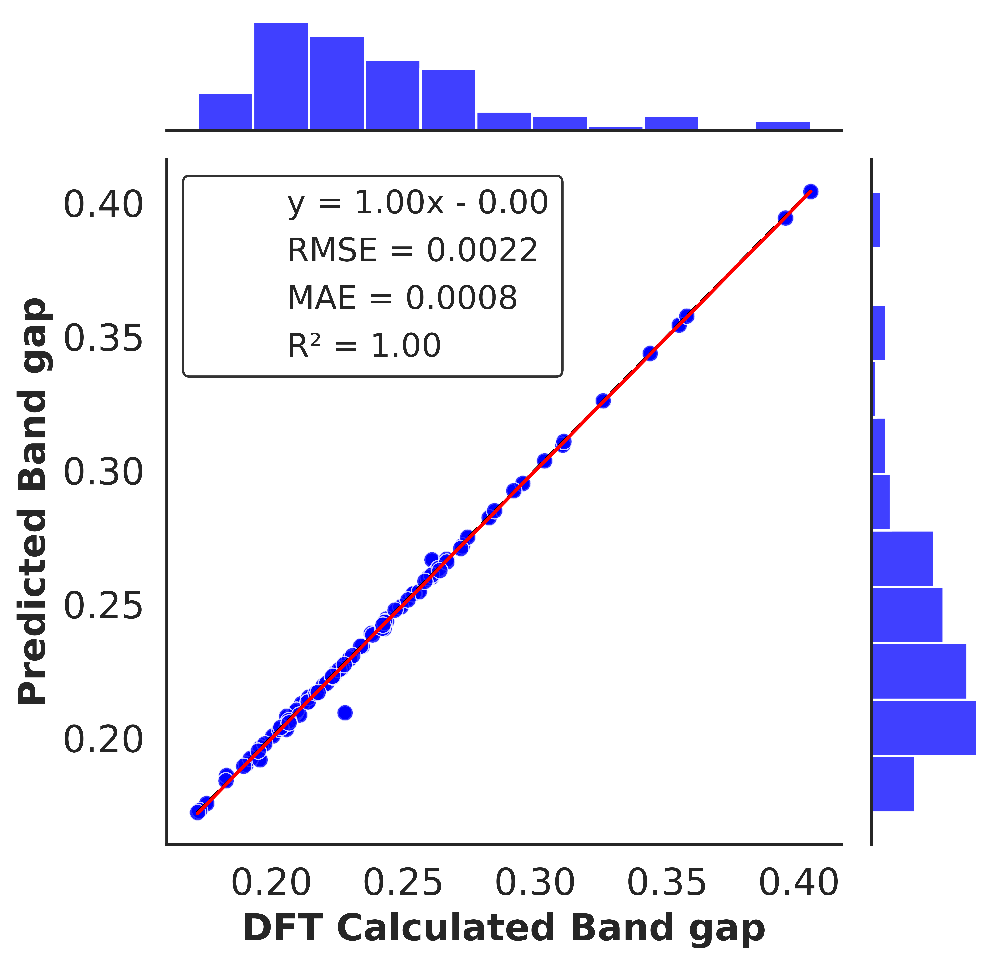

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math

sns.set(style="white", color_codes=True)
GPR_pred  = GPR_model.predict(x_test)

# Flatten data
y_test_vals = y_test.values.flatten() if hasattr(y_test, 'values') else y_test.flatten()
GPR_pred_vals = GPR_pred.flatten()

# Fit linear regression y = mx + c
X = y_test_vals.reshape(-1, 1)
y = GPR_pred_vals
linreg = LinearRegression()
linreg.fit(X, y)
m = linreg.coef_[0]
c = linreg.intercept_

# Correct metrics
rmse = math.sqrt(mean_squared_error(y_test_vals, GPR_pred_vals))
mae  = mean_absolute_error(y_test_vals, GPR_pred_vals)
r2   = r2_score(y_test_vals, GPR_pred_vals)

# Plot scatter
g = sns.jointplot(x=y_test_vals, y=GPR_pred_vals, kind="scatter",
                  color="blue", space=0, height=6)
g.plot_joint(plt.scatter, color="blue", edgecolor="white",
             s=50, linewidth=0.5, alpha=0.8)

# Diagonal line
lower_limit = min(y_test_vals.min(), GPR_pred_vals.min())
upper_limit = max(y_test_vals.max(), GPR_pred_vals.max())
x_vals = np.array([lower_limit, upper_limit])
g.ax_joint.plot(x_vals, x_vals, linestyle='--', color='black')

# Regression line
y_vals = m * x_vals + c
g.ax_joint.plot(x_vals, y_vals, linestyle='-', color='red')

# Equation formatting
if abs(c) < 1e-6:
    equation_text = f"y = {m:.2f}x"
elif c > 0:
    equation_text = f"y = {m:.2f}x + {c:.2f}"
else:
    equation_text = f"y = {m:.2f}x - {abs(c):.2f}"

# ✅ Round metrics to 2 decimals
rmse_text = f"RMSE = {rmse:.4f}"
mae_text  = f"MAE = {mae:.4f}"
r2_text   = f"R² = {r2:.2f}"

# Legend
handles = [
    plt.Line2D([], [], linestyle='', label=equation_text),
    plt.Line2D([], [], linestyle='', label=rmse_text),
    plt.Line2D([], [], linestyle='', label=mae_text),
    plt.Line2D([], [], linestyle='', label=r2_text)
]

g.ax_joint.legend(handles=handles, fontsize=14, loc='upper left',
                  edgecolor='black', facecolor='white', frameon=True)

# Labels and styling
g.set_axis_labels("DFT Calculated Band gap", "Predicted Band gap",
                  fontsize=16, weight='bold')

g.fig.tight_layout()
g.fig.subplots_adjust(top=0.95)

# Ticks
g.ax_joint.tick_params(axis='both', which='major', labelsize=16, width=1.5)
g.ax_marg_x.tick_params(axis='x', labelsize=16)
g.ax_marg_y.tick_params(axis='y', labelsize=16)

g.ax_joint.grid(False)

plt.show()


In [ ]:
x = pd.concat([x_train, x_test], axis=0)
y = pd.concat([y_train, y_test], axis=0)
train_sizes = [0.9,0.85,0.80,0.75,0.70,0.65,0.60,0.55,0.50]
from sklearn.model_selection import learning_curve
train_sizes, train_scores, test_scores = learning_curve(
estimator = GPR_model,
X = x,
y = y, train_sizes = train_sizes, cv = 10,
scoring = 'neg_mean_squared_error')

In [ ]:
rmse_train = np.sqrt(-train_scores)   # (n_sizes, n_folds)
rmse_test  = np.sqrt(-test_scores)
rmse_train_mean = rmse_train.mean(axis=1)
rmse_train_std  = rmse_train.std(axis=1)
rmse_test_mean  = rmse_test.mean(axis=1)
rmse_test_std   = rmse_test.std(axis=1)

## **Learning Curve**

In [ ]:
import matplotlib.pyplot as plt

# Plotting Learning Curves for RMSE
plt.figure(figsize=(8, 6))
plt.plot(train_sizes, rmse_train_mean, marker='D', markersize=11,
         label="Training RMSE", color='red', linewidth=2)
plt.plot(train_sizes, rmse_test_mean, marker='D', markersize=11,
         label="Test RMSE", color='blue', linewidth=2)

# Axis labels
plt.xlabel('Training set size', fontweight='bold', fontsize=14)
plt.ylabel('RMSE', fontweight='bold', fontsize=14)

# Tick styling
plt.xticks(fontsize=14, weight='bold')
plt.yticks(fontsize=14, weight='bold')

# Legend
plt.legend(fontsize=14, edgecolor='black')

# Grid and border styling
plt.grid(True)
plt.rcParams['font.size'] = 18
plt.rcParams['figure.dpi'] = 1200
plt.rcParams['axes.linewidth'] = 1
plt.rc('axes', edgecolor='black')

# Show the plot
plt.tight_layout()
plt.show()


# **10-fold cross validation**

In [ ]:
from sklearn.kernel_ridge import KernelRidge
from sklearn.model_selection import cross_val_score
import numpy as np
GPR= GaussianProcessRegressor(kernel=kernel, alpha=1e-6, random_state=42)
# Define the model
#KRR_model = KernelRidge(alpha=10, gamma=0.001, kernel='poly')

# 10-fold CV: MAE
mae_scores = cross_val_score(GPR, x_train, y_train,
                             scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
GPR_mae_cv = -mae_scores
average_mae = GPR_mae_cv.mean()

# 10-fold CV: RMSE (use neg_mean_squared_error, then sqrt)
mse_scores = cross_val_score(GPR, x_train, y_train,
                             scoring='neg_mean_squared_error', cv=10, n_jobs=-1)
GPR_rmse_cv = np.sqrt(-mse_scores)
average_rmse = GPR_rmse_cv.mean()

# 10-fold CV: R²
r2_scores = cross_val_score(GPR, x_train, y_train,
                            scoring='r2', cv=10, n_jobs=-1)
average_r2 = r2_scores.mean()

# Output
print("10-Fold MAE (each fold):", np.round(GPR_mae_cv, 4))
print("Average MAE:", round(average_mae, 4))

print("\n10-Fold RMSE (each fold):", np.round(GPR_mae_cv, 4))
print("Average RMSE:", round(average_rmse, 4))

print("\n10-Fold R² scores:", np.round(r2_scores, 4))
print("Average R² Score:", round(average_r2, 4))


10-Fold MAE (each fold): [0.001  0.0009 0.001  0.0009 0.0021 0.0013 0.0008 0.0017 0.0012 0.0012]
Average MAE: 0.0012

10-Fold RMSE (each fold): [0.001  0.0009 0.001  0.0009 0.0021 0.0013 0.0008 0.0017 0.0012 0.0012]
Average RMSE: 0.0024

10-Fold R² scores: [0.9967 0.999  0.9991 0.9993 0.9808 0.998  0.9993 0.9919 0.9957 0.9989]
Average R² Score: 0.9959


In [ ]:
import pandas as pd
import numpy as np

# Create DataFrame with RMSE values rounded to 3 decimals
rmse_table = pd.DataFrame({
    "Fold": np.arange(1, len(GPR_rmse_cv) + 1),
    "RMSE": np.round(GPR_rmse_cv, 3)
})

# Append the average row
rmse_table.loc[len(rmse_table)] = ["Average", round(average_rmse, 3)]

# Print without index
print(rmse_table.to_string(index=False))



   Fold  RMSE
      1 0.028
      2 0.038
      3 0.034
      4 0.035
      5 0.031
      6 0.033
      7 0.037
      8 0.034
      9 0.027
     10 0.035
Average 0.033


# **Permutation Feature Importance**

In [ ]:
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.cm as cm

# ---- Compute permutation importance for GPR ----
result = permutation_importance(
    GPR_model,      # ← changed from KRR_model
    x_test,
    y_test,
    n_repeats=10,
    random_state=42,
    n_jobs=-1
)

importances = result.importances_mean
stds = result.importances_std

# Filter features with positive importance (optional threshold)
threshold = 1e-4
positive_idx = importances > threshold
importances_pos = importances[positive_idx]
stds_pos = stds[positive_idx]
features_pos = x_test.columns[positive_idx]

# Sort by descending importance
sorted_idx = np.argsort(importances_pos)[::-1]
importances_pos = importances_pos[sorted_idx]
stds_pos = stds_pos[sorted_idx]
features_pos = features_pos[sorted_idx]

# Select top 20
top_n = 20
importances_top = importances_pos[:top_n]
features_top = features_pos[:top_n]

# Percentage contribution
total_importance = importances_top.sum()
percent_contrib = (importances_top / total_importance) * 100

# Color mapping (viridis)
norm = plt.Normalize(importances_top.min(), importances_top.max())
colors = cm.viridis(norm(importances_top))

# ---- Plot ----
plt.figure(figsize=(14, 8))
bars = plt.bar(range(len(importances_top)),
               importances_top,
               color=colors,
               edgecolor='black')

plt.xticks(range(len(importances_top)),
           features_top,
           rotation=45,
           ha='right',
           fontsize=20,weight='bold')

plt.yticks(fontsize=20,weight='bold')

plt.ylabel("Permutation Importance", fontsize=20, fontweight='bold')

# Add percentage labels
for bar, pct in zip(bars, percent_contrib):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2,
             height,
             f'{pct:.1f}%',
             ha='center',
             va='bottom',
             fontsize=14,
             fontweight='bold')

plt.tight_layout()
plt.show()


Output hidden; open in https://colab.research.google.com to view.

# **SHAP INTERPRETATIONS**

In [ ]:
! pip install shap

In [ ]:
import shap
import pandas as pd
from sklearn.metrics import accuracy_score
from matplotlib import pyplot as plt

#**SHAP SUMMARY BAR PLOT**

In [ ]:
import shap

# Use the entire training set as background
background = x_train  # shape: (368, n_features)

# Create a SHAP KernelExplainer
explainer = shap.KernelExplainer(GPR_model.predict, background)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(x_test)

# Visualize the results
shap.summary_plot(shap_values, x_test)


  0%|          | 0/92 [00:00<?, ?it/s]

# **SHAP SUMMARY PLOT WITH PRECENTAGE**

In [ ]:
import shap
import matplotlib.pyplot as plt
import numpy as np

# Compute mean absolute SHAP values
shap_values_mean = np.abs(shap_values).mean(axis=0)
feature_names = x_train.columns

# Convert to percentage
shap_percent = 100 * shap_values_mean / shap_values_mean.sum()

# Create bar plot
plt.figure(figsize=(10,6))
bars = plt.barh(feature_names, shap_percent, color='blue')

# Add text labels (percentage) on top of bars
for bar, percent in zip(bars, shap_percent):
    plt.text(bar.get_width() + 0.03, bar.get_y() + bar.get_height()/2,
             f'{percent:.1f}%', va='center', fontsize=14, fontweight='bold')

plt.xlabel("Feature contribution (%)", fontsize=16, fontweight='bold')
plt.ylabel("Features", fontsize=16, fontweight='bold')
plt.xticks(fontsize=15, fontweight='bold', color='black')
plt.yticks(fontsize=15, fontweight='bold', color='black')
plt.gca().invert_yaxis()  # highest on top

# Remove top and right axes
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.show()


In [ ]:
hap.summary_plot(shap_values, x_train, plot_type="bar", show = False )
#plt.xticks([0.0, 0.05, 0.10, 0.15, 0.20, 0.25],fontsize=20, fontweight='bold', color='black')
#plt.xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2],fontsize=20, fontweight='bold')
plt.xticks(fontsize=12, fontweight='bold', color='black')
plt.yticks(fontsize=12, fontweight='bold', color='black')
custom_legend = plt.legend(loc='upper right', bbox_to_anchor=(1, 1), frameon=False)
#plt.gca().get_legend().remove()
for text in custom_legend.get_texts():
    text.set_fontweight('bold')
    text.set_fontsize(11)
plt.xlabel("mean(|SHAP Value|",fontsize=18, fontweight='bold')

/tmp/ipython-input-56438006.py:6: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  custom_legend = plt.legend(loc='upper right', bbox_to_anchor=(1, 1), frameon=False)


Text(0.5, 270.1999999999999, 'mean(|SHAP Value|')

# **SHAP BEESWARM PLOT**

In [ ]:
import matplotlib.pyplot as plt

shap.summary_plot(shap_values, x_test, feature_names=x_test.columns, show=False)

plt.xticks(fontsize=12, color='black', fontweight='bold')
plt.yticks(fontsize=12, color='black', fontweight='bold')
plt.xlabel("SHAP Value", fontsize=15, fontweight='bold')
plt.ylabel("Feature", fontsize=15, fontweight='bold')
plt.show()